##### Copyright 2018 Google LLC.

Licensed under the Apache License, Version 2.0 (the "License");

In [0]:
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Decomposed Feature Visualization (rough)

Decomposed feature visualization is a techhnique for understanding the *mechanics* of how neural network features operate. This is a very early experiment with them.




# Setup

In [4]:
# Install Lucid & tensorflow

#!pip install --quiet lucid==0.0.5
!pip install -U --no-deps  git+https://github.com/tensorflow/lucid.git@cossim_pow
!npm install -g svelte-cli@2.2.0
# %tenorflow_version only works on colab
%tenorflow_version 1.x

  Cloning https://github.com/tensorflow/lucid.git (to revision cossim_pow) to /tmp/pip-req-build-jFjMCE
  Running setup.py bdist_wheel for lucid ... - done
  Stored in directory: /tmp/pip-ephem-wheel-cache-5vLfsh/wheels/f8/d3/20/76b36f194561d5dc843ffce217687ba9acd21efb17046aa243
Successfully built lucid
  Found existing installation: lucid 0.1.0
    Uninstalling lucid-0.1.0:
      Successfully uninstalled lucid-0.1.0
/tools/node/bin/svelte -> /tools/node/lib/node_modules/svelte-cli/bin.js
/tools/node/lib
└── svelte-cli@2.2.0 



In [0]:
# Imports

import numpy as np
import scipy.ndimage as nd
import tensorflow as tf
assert tf.__version__.startswith('1')

import lucid.modelzoo.vision_models as models
from lucid.misc.io import show, load
import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render
import lucid.optvis.transform as transform

from lucid.misc.gradient_override import gradient_override_map
from lucid.misc.io.showing import _image_url
import lucid.scratch.web.svelte as lucid_svelte
from lucid.misc.channel_reducer import ChannelReducer

In [0]:
# Let's import a model from the Lucid modelzoo!

model = models.InceptionV1()
model.load_graphdef()

In [0]:
def make_MaxSmoothPoolGrad(smooth_type="avg"):

  def MaxPoolGrad(op, grad):
    inp = op.inputs[0]
    
    op_args = [op.get_attr("ksize"), op.get_attr("strides"), op.get_attr("padding")]
    if smooth_type == "L2":
      smooth_out = tf.nn.avg_pool(inp**2, *op_args)/ (1e-2+tf.nn.avg_pool(tf.abs(inp), *op_args))
    elif smooth_type == "avg":
      smooth_out = tf.nn.avg_pool(inp, *op_args)
    else:
      raise RuntimeError("Invalid smooth_type")
    inp_smooth_grad = tf.gradients(smooth_out, [inp], grad)[0]
      
    return inp_smooth_grad
  return MaxPoolGrad

In [0]:
# def hidden_opt(layer, obj, W, require_pos=False, override={"MaxPool": make_MaxSmoothPoolGrad()}):
#   with tf.Graph().as_default(), tf.Session() as sess, gradient_override_map(override or {}):
    
#     t_input = tf.placeholder("float32", [1, None, None, 3])
#     T = render.import_model(model, t_input, t_input)
#     loss = obj(T)
#     t_layer = T(layer)
#     t_layer_grad = tf.gradients(loss, t_layer)[0]

    
#     vecs = 0.001*np.random.randn(1, W, W, t_layer.shape[-1])
#     m  = 0.0*np.random.randn(1, W, W, t_layer.shape[-1])
#     m2 = 0.0*np.random.randn(1, W, W, t_layer.shape[-1]) + 1
#     for i in range(2000):
#       grad = t_layer_grad.eval({t_layer: vecs})
#       if i % 500 == 0: print loss.eval({t_layer: vecs}), 
      
#       m  = 0.95*m  + (1-0.95)*grad
#       m2 = 0.95*m2 + (1-0.95)*grad**2
#       vecs += 0.1 * m / np.mean(np.sqrt(1e-4 + np.sqrt(m2)))
      
#       if require_pos:
#         vecs = np.maximum(0, vecs)
#     print ""
      
#     return vecs[0]


def hidden_opt(layer, obj, W, require_pos=False, override={"MaxPool": make_MaxSmoothPoolGrad()}):
  with tf.Graph().as_default(), tf.Session() as sess, gradient_override_map(override or {}):
    
    t_input = tf.placeholder("float32", [1, None, None, 3])
    T = render.import_model(model, t_input, t_input)
    loss = obj(T)
    t_layer = T(layer)
    vecs = 0.001*np.random.randn(1, W, W, t_layer.shape[-1])
    t_layer_grad = tf.gradients(loss, t_layer)[0]

    for i in range(5000):
      if i % 500 == 0: print loss.eval({t_layer: vecs}), 
      vecs += 0.01 * t_layer_grad.eval({t_layer: vecs})
      if require_pos:
        vecs = np.maximum(0, vecs)
    print ""
      
    return vecs[0]


In [0]:
def build_img_grid(imgs, W, mags=None, pad=((0,0), (0,0))):
  print imgs.shape
  W2 = imgs.shape[2]
  
  imgs = imgs.reshape([W,W,W2,W2,3])
  if mags is not None:
    mags = mags.reshape([W,W,1,1,1]) / mags.max()
    imgs = imgs*mags + 0.9*(1-mags)
  
  imgs_ = np.pad(imgs, list(pad) + [(0,0), (0,0), (0,0)],
                 mode='constant', constant_values=(0.9,))
  imgs_ = np.pad(imgs_, [(0,0), (0,0), (0,1), (0,1), (0,0)],
                 mode='constant', constant_values=(1,))
  
  return np.hstack(np.hstack(imgs_))

In [0]:
def vis_vecs(layer, W, vecs, cossim_pow=0, n_steps=512):
  vecs_flat = vecs.reshape([-1, vecs.shape[-1]])
  print W, vecs_flat.shape[0]
  param_f = lambda: param.image(W, batch=vecs_flat.shape[0])

  obj = objectives.Objective.sum([
      objectives.direction_neuron(layer, vec, batch=n, cossim_pow=cossim_pow)
      for n, vec in enumerate(vecs_flat.astype("float32"))
  ])
  
  imgs = render.render_vis(model, obj, param_f, thresholds=(n_steps,))
  
  return imgs[0].reshape(list(vecs.shape[:-1]) + [W,W,3])

In [0]:
def decomposed_vis(layer, obj, W=8, W2=32, override={"MaxPool": make_MaxSmoothPoolGrad()}, cossim_pow=0, n_steps=512, quiet=False):
  vecs = hidden_opt(layer, obj, W=W, override=override)
  
  mags = np.sqrt((vecs**2).sum(2))
  imgs = vis_vecs(layer, W2, vecs, cossim_pow=cossim_pow, n_steps=512)
  grid = build_img_grid(imgs, W, mags=mags)
  if not quiet: show(grid)
  return locals()

In [0]:
layer_names = """
conv2d0
maxpool0
conv2d1
conv2d2
maxpool1
mixed3a
mixed3b
maxpool4
mixed4a
mixed4b
mixed4c
mixed4d
mixed4e
maxpool10
mixed5a
mixed5b""".split("\n")[1:]

# Recursive Decomposition

In [0]:
obj = objectives.neuron("mixed4c_pre_relu", 447)

[-0.51079863] [6.5911255] [12.829636] [18.77815] [24.584057] [30.315487] [36.000496] [41.65666] [47.30262] [52.94136] 
56 25
512 [[144.63382 146.99521 149.4607  148.06459 147.12416]
 [153.99545 168.77875 180.20587 173.89943 159.7942 ]
 [165.54225 191.23601 214.1224  201.15804 175.64986]
 [158.67683 176.09937 191.18983 186.75494 169.69888]
 [148.59766 152.53235 158.21446 157.51472 153.4123 ]]



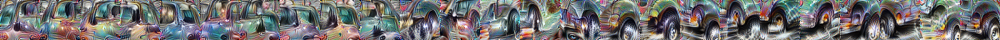

(5, 5, 56, 56, 3)



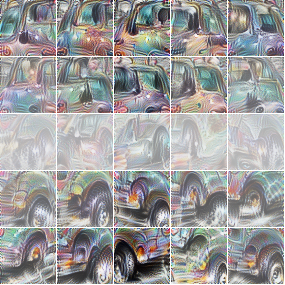

In [17]:
decompose_4b = decomposed_vis("mixed4b", obj, W=5, W2=48, cossim_pow=2, n_steps=512)

[-2.6009047] [11.376429] [21.603607] [29.666616] [36.778282] [43.4215] [49.85405] [56.143425] [62.356266] [68.53829] 
48 81
512 165.95876



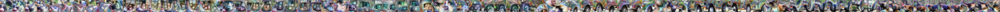

(9, 9, 48, 48, 3)



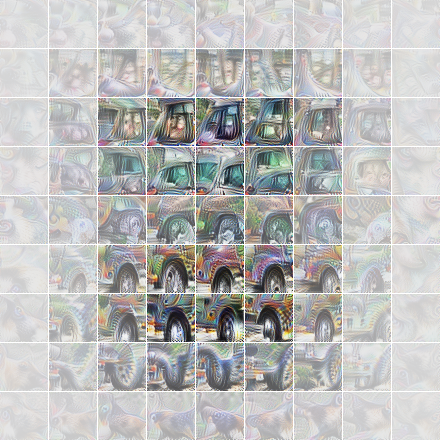

In [20]:
decompose_4a = decomposed_vis("mixed4a", obj, W=9, W2=48, cossim_pow=2, n_steps=512)

In [0]:
sub_grid_grid = []
for x in range(5):
  sub_grids = []
  for y in range(5):

    obj2 = objectives.direction_neuron("mixed4b", decompose_4b["vecs"][x,y], cossim_pow=0)
    decompose_4a_sub = decomposed_vis("mixed4a", obj2, W=5, W2=48, cossim_pow=2, n_steps=512)
    
    grid = build_img_grid(
        imgs=decompose_4a_sub["imgs"],
        W=decompose_4a_sub["W"],
        mags=decompose_4a_sub["mags"],
        pad=((x,4-x),(y,4-y)))
    
    sub_grids.append(grid)
    show(grid)
  sub_grid_grid.append(sub_grids)


In [0]:
sub_grid_grid_img = np.hstack(np.hstack(
        np.asarray(sub_grid_grid)
    ))

In [25]:
%%html_define_svelte DecomposedVis

<!--
<div class="container" style="width: {{size}}px; height: {{size}}px; ">
  <div class="image" style="background-image: url({{image_url}}); z-index: -10; width: {{size}}px; height: {{size}}px;"></div>
  <div class="overlay" style="z-index: 10; width: {{size}}px; height: {{size}}px; left: {{size/2-N/2}}px; top:{{size/2-N/2}}px">
    <div class="overlay-inner" style="background-image: url({{masks_url}}); width: {{N}}px; height: {{N}}px; transform: scale({{size/N}}); background-position: {{-pos[0]*N}}px {{-pos[1]*N}}px; opacity: 0.7;">
    </div>
  </div>
  <div class="event-catcher" style="z-index: 20; width: {{size}}px; height: {{size}}px;" on:mousemove="set({pos: [Math.floor(N*event.offsetX/size), Math.floor(N*event.offsetY/size)]})"></div>
</div>
-->

<div class="container" style="width: {{layer1_size}}px; height: {{layer1_size}}px; ">
  <div class="image" style="background-image: url({{layer1_img_url}}); z-index: -10; width: {{layer1_size}}px; height: {{layer1_size}}px;"></div>
  <div class="event-catcher" style="z-index: 20; width: {{layer1_size}}px; height: {{layer1_size}}px;"
       on:mousemove="set({pos: [Math.floor(N*event.offsetX/layer1_size), Math.floor(N*event.offsetY/layer1_size)]})"
       on:mouseout="set({pos: undefined})"></div>
</div>

<div class="container" style="width: {{layer2_size}}px; height: {{layer2_size}}px; ">
  <div class="image" style="background-image: url({{layer2_img_url}}); z-index: -10; width: {{layer2_size}}px; height: {{layer2_size}}px; "></div>
  <div class="image" style="background-image: url({{layer2_img_grid_url}}); z-index: 10; width: {{layer2_size}}px; height: {{layer2_size}}px; background-position: {{(pos == undefined)? '' : -pos[0]*layer2_size}}px {{(pos == undefined)? '' : -pos[1]*layer2_size}}px; opacity: {{(pos == undefined)? '0' : 1}};"></div>
</div>

<br style="clear: both;">

<div>{{pos}}</div>

<style>
  .container {
    position: relative;
    float: left;
    margin-left: 8px;
  }
  .image, .overlay, .event-catcher {
    position: absolute;
    left: 0px;
    top: 0px;
  }
  .overlay-inner {
    image-rendering: pixelated;
  }
</style>

<script>

  
  export default {
    data () {
      return {
        "full_img_url": undefined,
        "full_size": undefined,
        "layer1_img_url": undefined,
        "layer1_size": undefined,
        "layer2_img_url": undefined,
        "layer2_img_grid_url": undefined,
        "layer1_size": undefined,
        N: 5,
        pos: undefined
      };
    },
    computed: {
    },
    helpers: {}
  };
</script>

Trying to build svelte component from html...
svelte compile --format iife /tmp/svelte_xb1Ln7/DecomposedVis_41af5e0e_6339_41da_bf61_bda00a3bdb11.html > /tmp/svelte_xb1Ln7/DecomposedVis_41af5e0e_6339_41da_bf61_bda00a3bdb11.js
svelte version 1.64.1
compiling ../tmp/svelte_xb1Ln7/DecomposedVis_41af5e0e_6339_41da_bf61_bda00a3bdb11.html...




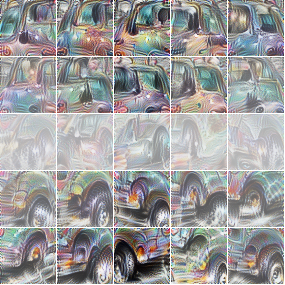
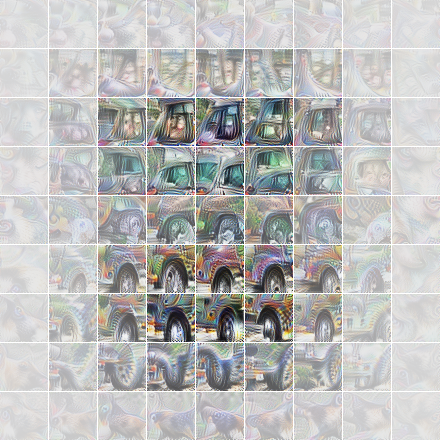
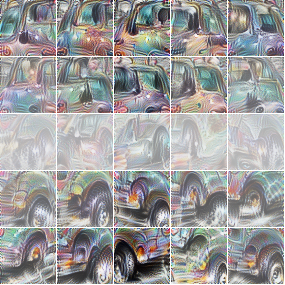
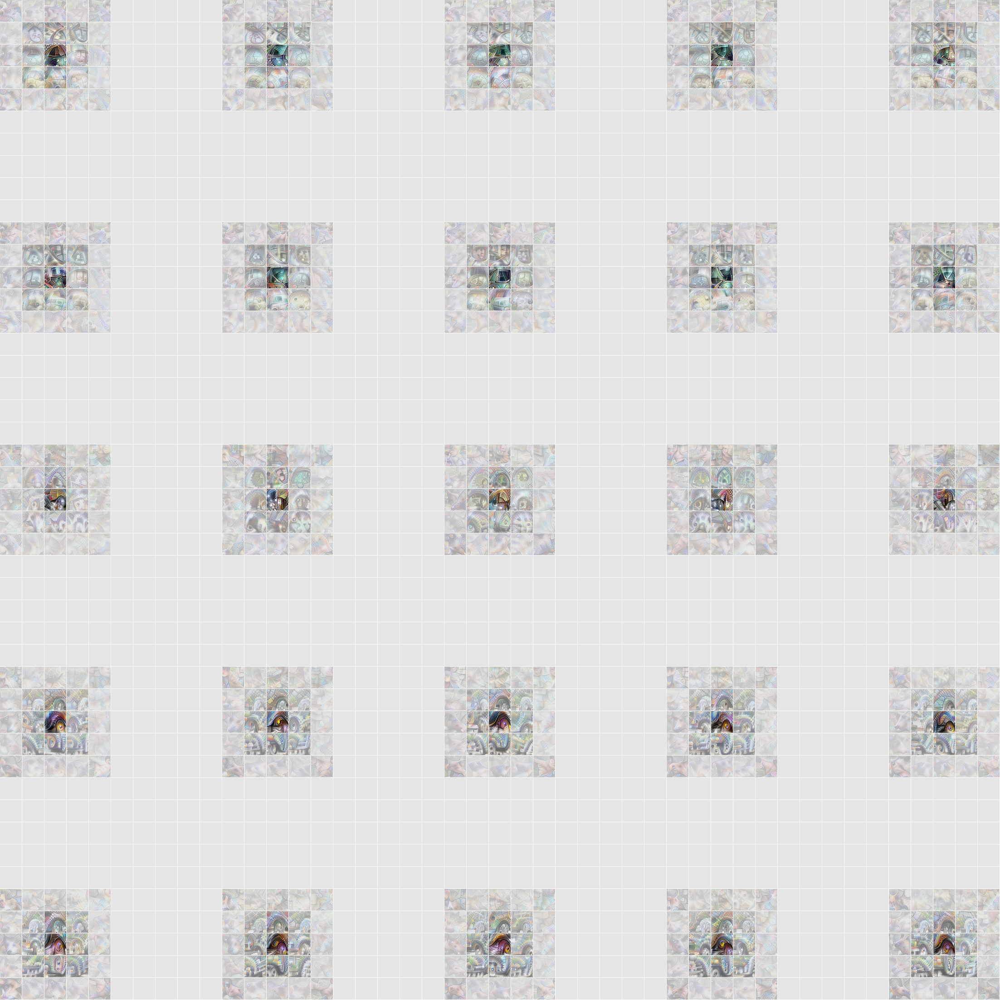

In [30]:
lucid_svelte.DecomposedVis({
    "full_img_url": _image_url(decompose_4b["grid"]),
    "full_size": 224,
    "layer1_img_url": _image_url(decompose_4b["grid"]),
    "layer1_size": decompose_4b["grid"].shape[0],
    "layer2_img_url": _image_url(decompose_4a["grid"]),
    "layer2_img_grid_url": _image_url(sub_grid_grid_img),
    "layer2_size": sub_grid_grid[0][0].shape[0],
})

# Activation Grid Experiment

In [0]:
obj = objectives.neuron("mixed4c_pre_relu", 447)

[-0.51199806] [6.590143] [12.829054] [18.777506] [24.583187] [30.314486] [35.999496] [41.655632] [47.301636] [52.940205] 
48 25
512 617.6893



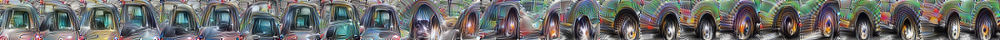

(5, 5, 48, 48, 3)



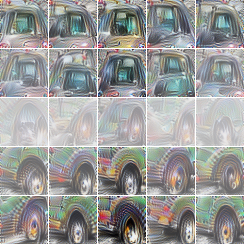

In [82]:
decompose_4b_cossim0 = decomposed_vis("mixed4b", obj, W=5, W2=48, cossim_pow=0, n_steps=512)

In [0]:
def render_activation_grid_less_naive(img, model, layer="mixed4d", W=42,
                                 n_groups=6, subsample_factor=1, n_steps=256):
  
  # Get the activations
  with tf.Graph().as_default(), tf.Session() as sess:
    t_input = tf.placeholder("float32", [None, None, None, 3])
    T = render.import_model(model, t_input, t_input)
    acts = T(layer).eval({t_input: img[None]})[0]
  acts_flat = acts.reshape([-1] + [acts.shape[2]])
  N = acts_flat.shape[0]
  
  # The trick to avoiding "decoherence" is to recognize images that are
  # for similar activation vectors and 
  if n_groups > 0:
    reducer = ChannelReducer(n_groups, "NMF")
    groups = reducer.fit_transform(acts_flat)
    groups /= groups.max(0)
  else:
    groups = np.zeros([])
    
  print groups.shape

  
  # The key trick to increasing memory efficiency is random sampling.
  # Even though we're visualizing lots of images, we only run a small
  # subset through the network at once. In order to do this, we'll need
  # to hold tensors in a tensorflow graph around the visualization process.
  
  with tf.Graph().as_default() as graph, tf.Session() as sess:
    
    
    # Using the groups, create a paramaterization of images that
    # partly shares paramters between the images for similar activation
    # vectors. Each one still has a full set of unique parameters, and could
    # optimize to any image. We're just making it easier to find solutions
    # where things are the same.
    group_imgs_raw = param.fft_image([n_groups, W, W, 3])
    unique_imgs_raw = param.fft_image([N, W, W, 3])
    opt_imgs = param.to_valid_rgb(tf.stack([
            0.7*unique_imgs_raw[i] + 
            0.5*sum(groups[i, j] * group_imgs_raw[j] for j in range(n_groups))
            for i in range(N) ]),
            decorrelate=True)
    
    # Construct a random batch to optimize this step
    batch_size = 64
    rand_inds = tf.random_uniform([batch_size], 0, N, dtype=tf.int32)
    pres_imgs = tf.gather(opt_imgs, rand_inds)
    pres_acts = tf.gather(acts_flat, rand_inds)
    obj = objectives.Objective.sum(
      [objectives.direction(layer, pres_acts[n], batch=n)
       for n in range(batch_size)
      ])
    
    # Actually do the optimization...
    T = render.make_vis_T(model, obj, param_f=pres_imgs)
    tf.global_variables_initializer().run()
    
    for i in range(n_steps):
      T("vis_op").run()
      if (i+1) % (n_steps//2) == 0:
        show(pres_imgs.eval()[::4])
    
    vis_imgs = opt_imgs.eval()
    
  # Combine the images and display the resulting grid
  print ""
  vis_imgs_ = vis_imgs.reshape(list(acts.shape[:2]) + [W, W, 3])
  vis_imgs_cropped = vis_imgs_[:, :, 2:-2, 2:-2, :]
  show(np.hstack(np.hstack(vis_imgs_cropped)))
  return vis_imgs_cropped

In [0]:
def get_activations(layer, img):
  with tf.Graph().as_default(), tf.Session():
    t_input = tf.placeholder(tf.float32, [224, 224, 3])
    T = render.import_model(model, t_input, t_input)
    acts = T(layer).eval({t_input: img})[0]
  return acts

In [0]:
img = load("https://storage.googleapis.com/lucid-static/building-blocks/examples/car2.png")[::2,::2,:3]

In [0]:
acts = get_activations("mixed4c", img)


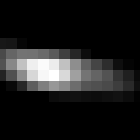

In [42]:
show(nd.zoom(acts[..., 447] / acts[..., 447].max(), [10,10], order=0))

(196, 6)



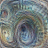
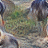
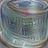
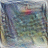
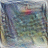
...
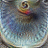
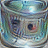
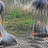
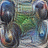


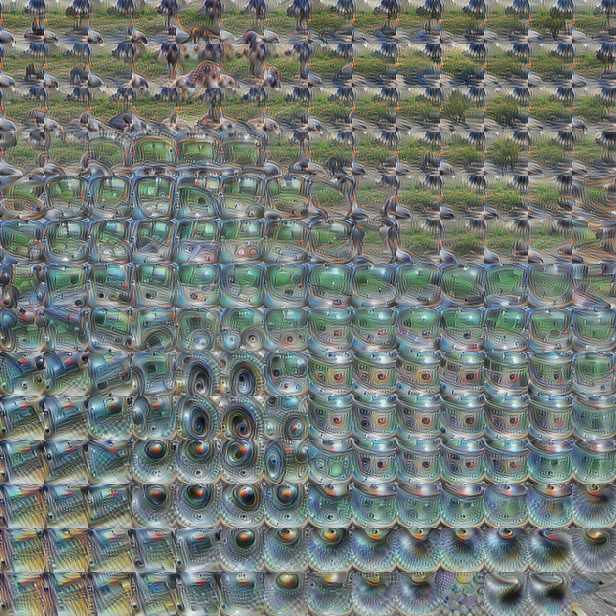

In [80]:
act_grid = render_activation_grid_less_naive(img, model, W=48, n_steps=256, layer="mixed4b")

In [0]:
W = decompose_4b_cossim0["vecs"]

In [0]:
acts_4b = get_activations("mixed4b", img)

In [0]:
attr_grid = []
for x in range(acts.shape[0]):
  line = []
  for y in range(acts.shape[1]):
    acts_ = acts_4b[max(0,x-2):min(x+3,acts.shape[0]), max(0,y-2):min(y+3,acts.shape[1])]
    acts__ = np.pad(acts_, ((-min(0,x-2), -min(0,acts.shape[0]-x-3)), (-min(0,y-2), -min(0,acts.shape[1]-y-3)), (0,0)), "constant" )
    line.append((W*acts__).sum(-1))
  attr_grid.append(line)


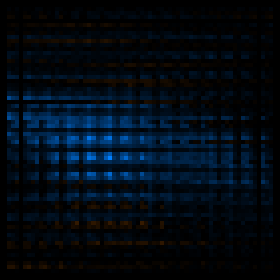

In [118]:
attr_grid_flat = np.hstack(np.hstack(attr_grid))
attr_grid_flat /= attr_grid_flat.max()
attr_grid_flat_pos = np.maximum(0, attr_grid_flat)
attr_grid_flat_neg = np.maximum(0, -attr_grid_flat)
attr_grid_flat_color = np.stack([attr_grid_flat_neg, 0.5*(attr_grid_flat_pos+attr_grid_flat_neg), attr_grid_flat_pos], -1)
show(nd.zoom(attr_grid_flat_color, [4,4,1], order=0))

In [141]:
%%html_define_svelte ConvExplain


<div class="container"> <img src="{{inp_img.url}}" /> </div>
<div class="container"> <img src="{{filter_grid.url}}" /> </div>

<br style="clear: both;">
<br>

<div class="container" style="width: {{act_grid.size}}px; height: {{act_grid.size}}px; ">
  <div class="image" 
       style="background-image: url({{act_grid.url}});
              z-index: -10;
              width: {{act_grid.size}}px;
              height: {{act_grid.size}}px;
              opacity: {{(pos == undefined)? 1.0 : 0.5}};
    "></div>
  <div class="image" 
       style="background-image: url({{act_grid.url}});
              width: {{act_grid.size*5/N}}px;
              height: {{act_grid.size*5/N}}px;
              opacity: {{(pos == undefined)? 0.0 : 1.0}};
              left: {{(pos == undefined)? 0 : act_grid.size*(pos[0]-2)/N}}px;
              top: {{(pos == undefined)? 0 : act_grid.size*(pos[1]-2)/N}}px;
              background-position: {{(pos == undefined)? '' : -act_grid.size*(pos[0]-2)/N}}px {{(pos == undefined)? '' : -act_grid.size*(pos[1]-2)/N}}px;
    "></div>
    <div class="image" 
       style="background-image: url({{attr_grid.url}});
              width: {{act_grid.size*5/N}}px;
              height: {{act_grid.size*5/N}}px;
              opacity: {{(pos == undefined)? 0.0 : 0.7}};
              left: {{(pos == undefined)? 0 : act_grid.size*(pos[0]-2)/N}}px;
              top: {{(pos == undefined)? 0 : act_grid.size*(pos[1]-2)/N}}px;
              background-position: {{(pos == undefined)? '' : -act_grid.size*(5*pos[0])/N}}px {{(pos == undefined)? '' : -act_grid.size*(5*pos[1])/N}}px;
    "></div>
</div>

<div class="container" style="width: {{out_grid.size}}px; height: {{out_grid.size}}px; ">
  <div class="image"
       style="background-image: url({{out_grid.url}});
              z-index: -10; width: {{out_grid.size}}px;
              height: {{out_grid.size}}px;
        "></div>
  <div class="event-catcher" style="z-index: 20; width: {{out_grid.size}}px; height: {{out_grid.size}}px;"
     on:mousemove="set({pos: [Math.floor(N*event.offsetX/out_grid.size), Math.floor(N*event.offsetY/out_grid.size)]})"
     on:mouseout="set({pos: undefined})"></div>
</div>



<br style="clear: both;">

<div>{{pos}}</div>

<style>
  .container {
    position: relative;
    float: left;
    margin-left: 8px;
  }
  .image, .overlay, .event-catcher {
    position: absolute;
    left: 0px;
    top: 0px;
  }
  .overlay-inner {
    image-rendering: pixelated;
  }
</style>

<script>

  
  export default {
    data () {
      return {
        inp_img:  {url: undefined, size: undefined},
        act_grid: {url: undefined, size: undefined},
        attr_grid: {url: undefined, size: undefined},
        filter_grid: {url: undefined, size: undefined},
        out_grid: {url: undefined, size: undefined},
        N: 5,
        pos: undefined
      };
    },
    computed: {
    },
    helpers: {}
  };
</script>

Trying to build svelte component from html...
svelte compile --format iife /tmp/svelte_xb1Ln7/ConvExplain_5cc7273a_a84a_43dc_a860_051471bb66cd.html > /tmp/svelte_xb1Ln7/ConvExplain_5cc7273a_a84a_43dc_a860_051471bb66cd.js
svelte version 1.64.1
compiling ../tmp/svelte_xb1Ln7/ConvExplain_5cc7273a_a84a_43dc_a860_051471bb66cd.html...
(3:24) – A11y: <img> element should have an alt attribute
(4:24) – A11y: <img> element should have an alt attribute




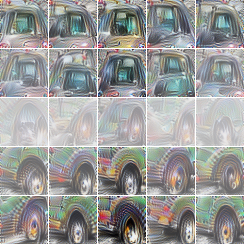
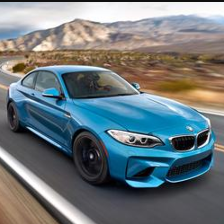
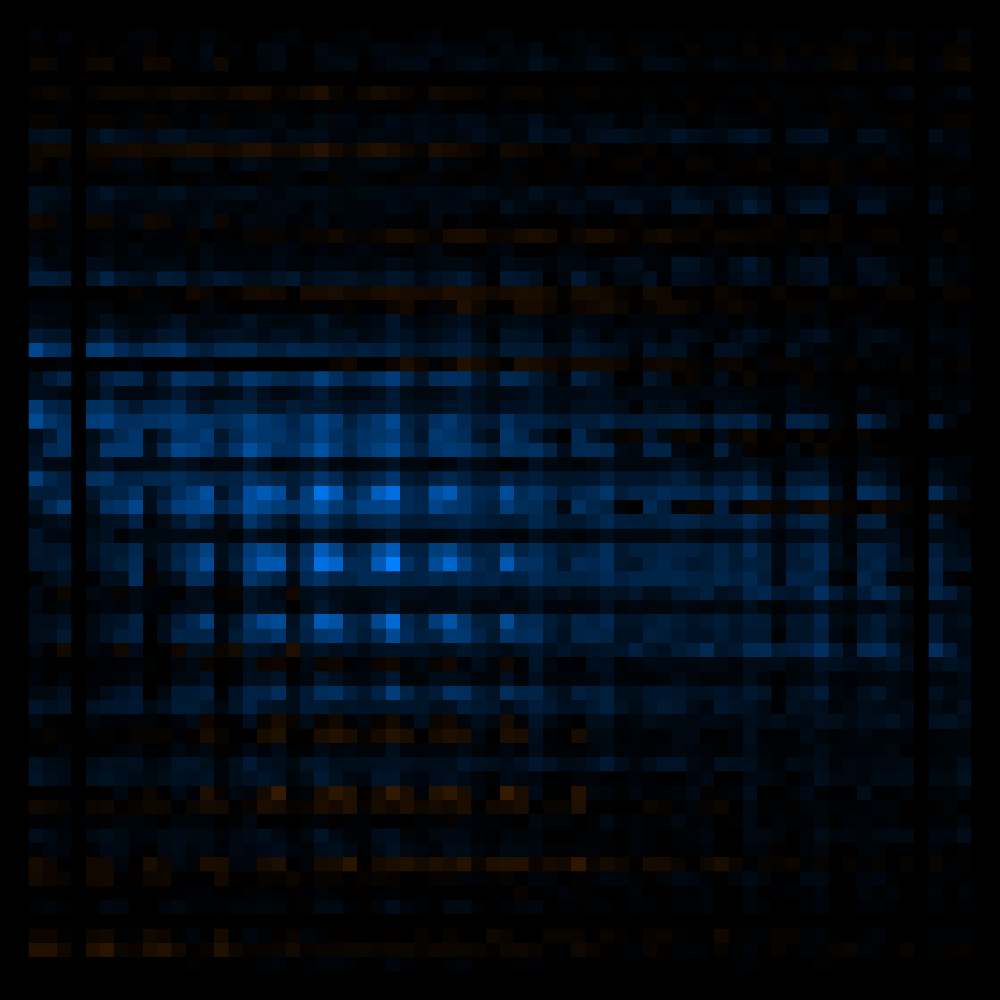
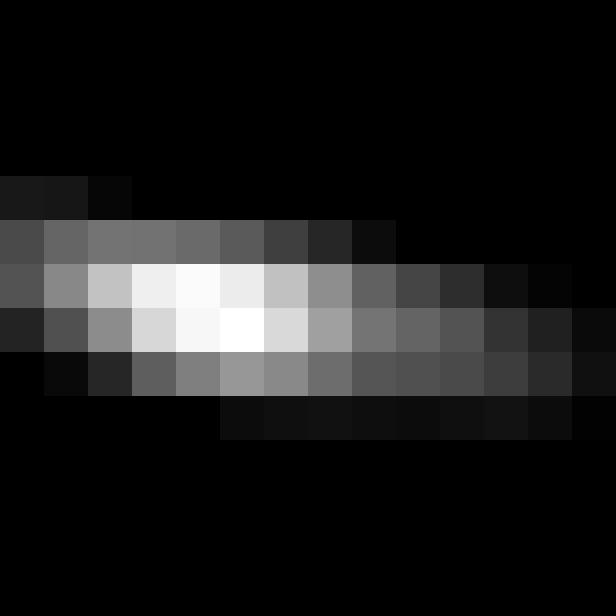
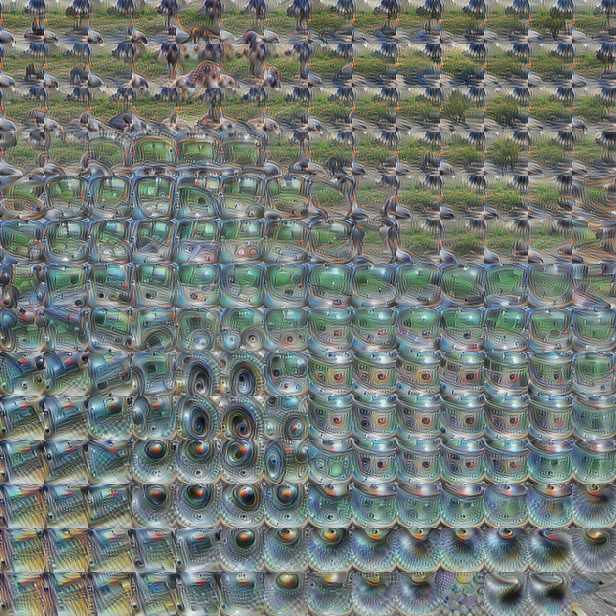

In [142]:
def prep_image(img):
  return {
      "url": _image_url(img),
      "size": img.shape[0]
  }

lucid_svelte.ConvExplain({
    "inp_img": prep_image(img),
    "act_grid": prep_image(np.hstack(np.hstack(act_grid))),
    "filter_grid": prep_image(decompose_4b_cossim0["grid"]),
    "out_grid": prep_image(np.hstack(np.hstack(
        nd.zoom(
            acts[:, :, None, None, 447] / acts[..., 447].max(),
            [1,1,48-4,48-4], order=0)
    ))),
    "attr_grid": prep_image(np.hstack(np.hstack(
        nd.zoom(
            attr_grid_flat_color[:, :, None, None, :],
            [1,1,48-4,48-4,1], order=0)
    ))),
    "N": acts.shape[0]
})

In [113]:
test_flat.shape

(14, 14)


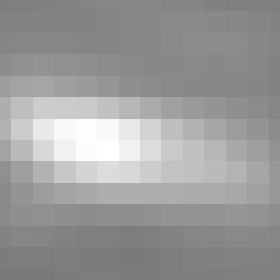

In [114]:
test_flat = np.hstack(np.hstack(np.asarray(test)[None,None]))
test_flat /= test_flat.max()
show(nd.zoom(0.5 + 0.5*test_flat, [20,20], order=0))